# Part 1: Aggregate login counts

# Sourcing and Loading Data 

In [1]:
import json 
import numpy as np
import pandas as pd 
import matplotlib as mpl 
import matplotlib.pyplot as plt 
import seaborn as sns 
import statsmodels.api as sm 
from statsmodels.graphics.api import abline_plot 
from sklearn.metrics import mean_squared_error, r2_score 
from sklearn.model_selection import train_test_split 
from sklearn import linear_model, preprocessing 
import warnings # For handling error messages 
warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.filterwarnings(action="ignore", module="scipy", message="^internal gelsd") 

In [2]:
with open('logins.json') as l: 
    logindf = json.load(l) 
print(logindf) 

{'login_time': ['1970-01-01 20:13:18', '1970-01-01 20:16:10', '1970-01-01 20:16:37', '1970-01-01 20:16:36', '1970-01-01 20:26:21', '1970-01-01 20:21:41', '1970-01-01 20:12:16', '1970-01-01 20:35:47', '1970-01-01 20:35:38', '1970-01-01 20:47:52', '1970-01-01 20:26:05', '1970-01-01 20:31:03', '1970-01-01 20:34:46', '1970-01-01 20:36:34', '1970-01-01 20:39:25', '1970-01-01 20:40:37', '1970-01-01 20:34:58', '1970-01-01 20:43:59', '1970-01-01 20:47:46', '1970-01-01 20:46:34', '1970-01-01 20:56:07', '1970-01-01 20:49:12', '1970-01-01 20:59:06', '1970-01-01 20:59:59', '1970-01-01 21:15:01', '1970-01-01 21:09:24', '1970-01-01 21:19:24', '1970-01-01 21:20:53', '1970-01-01 21:29:19', '1970-01-01 21:58:05', '1970-01-01 21:51:51', '1970-01-01 21:59:40', '1970-01-01 22:08:34', '1970-01-01 22:02:51', '1970-01-01 21:58:32', '1970-01-01 22:02:31', '1970-01-01 22:05:32', '1970-01-01 22:02:46', '1970-01-01 22:10:28', '1970-01-01 22:11:58', '1970-01-01 22:01:05', '1970-01-01 22:19:10', '1970-01-01 22:16:

In [3]:
logindf = pd.DataFrame(logindf) 
logindf

,login_time
0,1970-01-01 20:13:18
1,1970-01-01 20:16:10
2,1970-01-01 20:16:37
3,1970-01-01 20:16:36
4,1970-01-01 20:26:21
...,...
93137,1970-04-13 18:50:19
93138,1970-04-13 18:43:56
93139,1970-04-13 18:54:02
93140,1970-04-13 18:57:38


Cleaning and transforming

In [4]:
logindf.dtypes 

login_time    object
dtype: object

Check for/remove nulls 

In [5]:
logindf.isnull().values.any() 

False

Aggregate counts

In [6]:
logindf['login_time'] = pd.to_datetime(logindf['login_time']) 

In [7]:
logindf['count'] = 1
logindf.set_index('login_time', inplace=True)
logindf = logindf.resample('15T').agg({'count':'sum'}) 
print(logindf) 

                     count
login_time                
1970-01-01 20:00:00      2
1970-01-01 20:15:00      6
1970-01-01 20:30:00      9
1970-01-01 20:45:00      7
1970-01-01 21:00:00      1
...                    ...
1970-04-13 17:45:00      5
1970-04-13 18:00:00      5
1970-04-13 18:15:00      2
1970-04-13 18:30:00      7
1970-04-13 18:45:00      6

[9788 rows x 1 columns]


Visualize login counts

<AxesSubplot:xlabel='login_time'>

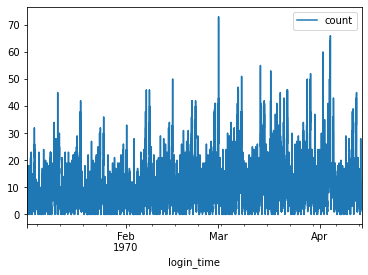

In [8]:
logindf.reset_index().plot(x='login_time', y='count')

In [9]:
logindf.describe() 

,count
count,9788.000000
mean,9.515938
std,8.328818
min,0.000000
25%,3.000000
50%,7.000000
75%,13.000000
max,73.000000


<AxesSubplot:xlabel='login_time'>

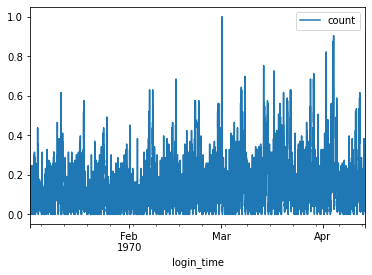

In [10]:
from sklearn.preprocessing import MinMaxScaler 
y = logindf['count'].values.reshape(-1, 1)
min_max_scaler = preprocessing.MinMaxScaler()
y_scaled = min_max_scaler.fit_transform(y)
logindf['count'] = y_scaled 
logindf.reset_index().plot(x='login_time', y='count') 

In [11]:
logindf.describe() 

,count
count,9788.000000
mean,0.130355
std,0.114093
min,0.000000
25%,0.041096
50%,0.095890
75%,0.178082
max,1.000000


# Part 2: Experiment and Metrics Design 

1. The key measure of success would be how often each driver partner services each city. If the number of times each driver partner services each city averages to at least 70/30 then this experiment will be a success because the driver parner will be servicing each city a considerable amount of times. 
    
2. a) Driver partners will be chosen at random and their locations will be monitored to see which city they service over a six months long time span. Three months will be spent monitoring where they service before the toll expenses are reimburesed and three months will be spent monitoring where they service after the toll expenses are reimbursed. At the end of the 6 months, it will be calculated how many times each driver parnter served each city. These counts will be scaled and then tested for statistical significance. 
    b) A p-test will be used for statistical significance. 
    c) If the test results prove to be statistically significant, then I would recommend to the city managers to continue reimbursing the toll expenses to the driver partners to continue having them serve both cities. 

# Part 3: Predictive Modeling 

# 3.1

In [12]:
with open('ultimate_data_challenge.json') as u: 
    df = json.load(u) 
print(df) 

[{'city': "King's Landing", 'trips_in_first_30_days': 4, 'signup_date': '2014-01-25', 'avg_rating_of_driver': 4.7, 'avg_surge': 1.1, 'last_trip_date': '2014-06-17', 'phone': 'iPhone', 'surge_pct': 15.4, 'ultimate_black_user': True, 'weekday_pct': 46.2, 'avg_dist': 3.67, 'avg_rating_by_driver': 5.0}, {'city': 'Astapor', 'trips_in_first_30_days': 0, 'signup_date': '2014-01-29', 'avg_rating_of_driver': 5.0, 'avg_surge': 1.0, 'last_trip_date': '2014-05-05', 'phone': 'Android', 'surge_pct': 0.0, 'ultimate_black_user': False, 'weekday_pct': 50.0, 'avg_dist': 8.26, 'avg_rating_by_driver': 5.0}, {'city': 'Astapor', 'trips_in_first_30_days': 3, 'signup_date': '2014-01-06', 'avg_rating_of_driver': 4.3, 'avg_surge': 1.0, 'last_trip_date': '2014-01-07', 'phone': 'iPhone', 'surge_pct': 0.0, 'ultimate_black_user': False, 'weekday_pct': 100.0, 'avg_dist': 0.77, 'avg_rating_by_driver': 5.0}, {'city': "King's Landing", 'trips_in_first_30_days': 9, 'signup_date': '2014-01-10', 'avg_rating_of_driver': 4.

In [13]:
df = pd.DataFrame(df) 
df 

,city,trips_in_first_30_days,signup_date,avg_rating_of_driver,avg_surge,last_trip_date,phone,surge_pct,ultimate_black_user,weekday_pct,avg_dist,avg_rating_by_driver
0,King's Landing,4,2014-01-25,4.7,1.10,2014-06-17,iPhone,15.4,True,46.2,3.67,5.0
1,Astapor,0,2014-01-29,5.0,1.00,2014-05-05,Android,0.0,False,50.0,8.26,5.0
2,Astapor,3,2014-01-06,4.3,1.00,2014-01-07,iPhone,0.0,False,100.0,0.77,5.0
3,King's Landing,9,2014-01-10,4.6,1.14,2014-06-29,iPhone,20.0,True,80.0,2.36,4.9
4,Winterfell,14,2014-01-27,4.4,1.19,2014-03-15,Android,11.8,False,82.4,3.13,4.9
...,...,...,...,...,...,...,...,...,...,...,...,...
49995,King's Landing,0,2014-01-25,5.0,1.00,2014-06-05,iPhone,0.0,False,100.0,5.63,4.2
49996,Astapor,1,2014-01-24,NaN,1.00,2014-01-25,iPhone,0.0,False,0.0,0.00,4.0
49997,Winterfell,0,2014-01-31,5.0,1.00,2014-05-22,Android,0.0,True,100.0,3.86,5.0
49998,Astapor,2,2014-01-14,3.0,1.00,2014-01-15,iPhone,0.0,False,100.0,4.58,3.5


In [14]:
df.dtypes

city                       object
trips_in_first_30_days      int64
signup_date                object
avg_rating_of_driver      float64
avg_surge                 float64
last_trip_date             object
phone                      object
surge_pct                 float64
ultimate_black_user          bool
weekday_pct               float64
avg_dist                  float64
avg_rating_by_driver      float64
dtype: object

Check for/remove nulls 

In [15]:
df.isnull().values.any() 

True

In [16]:
nan_values = df.isna()
nan_columns = nan_values.any()
columns_with_nan = df.columns[nan_columns].tolist()
print(columns_with_nan) 

['avg_rating_of_driver', 'phone', 'avg_rating_by_driver']


In [17]:
df['avg_rating_of_driver'] = df['avg_rating_by_driver'].fillna(df['avg_rating_by_driver'].mean()) 
df['avg_rating_by_driver'] = df['avg_rating_by_driver'].fillna(df['avg_rating_by_driver'].mean())

In [18]:
mask = df['phone'].isna() 
ind = df['phone'].loc[mask].sample(frac=0.5).index
df.loc[ind, 'phone'] = 'iphone'
df['phone'] = df['phone'].fillna('Android')
df 

,city,trips_in_first_30_days,signup_date,avg_rating_of_driver,avg_surge,last_trip_date,phone,surge_pct,ultimate_black_user,weekday_pct,avg_dist,avg_rating_by_driver
0,King's Landing,4,2014-01-25,5.0,1.10,2014-06-17,iPhone,15.4,True,46.2,3.67,5.0
1,Astapor,0,2014-01-29,5.0,1.00,2014-05-05,Android,0.0,False,50.0,8.26,5.0
2,Astapor,3,2014-01-06,5.0,1.00,2014-01-07,iPhone,0.0,False,100.0,0.77,5.0
3,King's Landing,9,2014-01-10,4.9,1.14,2014-06-29,iPhone,20.0,True,80.0,2.36,4.9
4,Winterfell,14,2014-01-27,4.9,1.19,2014-03-15,Android,11.8,False,82.4,3.13,4.9
...,...,...,...,...,...,...,...,...,...,...,...,...
49995,King's Landing,0,2014-01-25,4.2,1.00,2014-06-05,iPhone,0.0,False,100.0,5.63,4.2
49996,Astapor,1,2014-01-24,4.0,1.00,2014-01-25,iPhone,0.0,False,0.0,0.00,4.0
49997,Winterfell,0,2014-01-31,5.0,1.00,2014-05-22,Android,0.0,True,100.0,3.86,5.0
49998,Astapor,2,2014-01-14,3.5,1.00,2014-01-15,iPhone,0.0,False,100.0,4.58,3.5


In [19]:
df.isnull().values.any() 

False

Summary 

In [20]:
df.describe() 

,trips_in_first_30_days,avg_rating_of_driver,avg_surge,surge_pct,weekday_pct,avg_dist,avg_rating_by_driver
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,2.278200,4.778158,1.074764,8.849536,60.926084,5.796827,4.778158
std,3.792684,0.445753,0.222336,19.958811,37.081503,5.707357,0.445753
min,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,0.000000,4.700000,1.000000,0.000000,33.300000,2.420000,4.700000
50%,1.000000,5.000000,1.000000,0.000000,66.700000,3.880000,5.000000
75%,3.000000,5.000000,1.050000,8.600000,100.000000,6.940000,5.000000
max,125.000000,5.000000,8.000000,100.000000,100.000000,160.960000,5.000000


Visualizations 

In [21]:
df.columns

Index(['city', 'trips_in_first_30_days', 'signup_date', 'avg_rating_of_driver',
       'avg_surge', 'last_trip_date', 'phone', 'surge_pct',
       'ultimate_black_user', 'weekday_pct', 'avg_dist',
       'avg_rating_by_driver'],
      dtype='object')

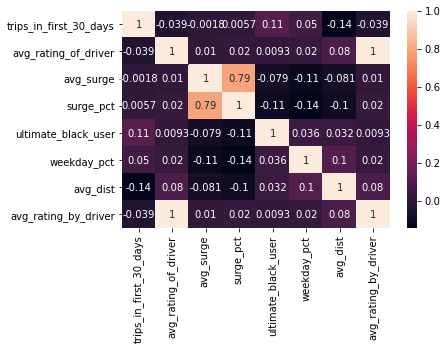

In [22]:
corrMatrix = df.corr()
sns.heatmap(corrMatrix, annot=True)
plt.show() 

In [23]:
retained = [] 
for x in df['trips_in_first_30_days']: 
    if x > 0: 
        retained.append(x) 
    else: 
        pass  
retention = len(retained) 
total = len(df['trips_in_first_30_days']) 
retention = retention/total * 100
print('The fraction of the observed users that were retained was:', retention, '%') 

The fraction of the observed users that were retained was: 69.22 %


# 3.2

In [24]:
from datetime import datetime
df['last_trip_date'] = pd.to_datetime(df['last_trip_date'], format='%Y-%m-%d')   
df.head() 

,city,trips_in_first_30_days,signup_date,avg_rating_of_driver,avg_surge,last_trip_date,phone,surge_pct,ultimate_black_user,weekday_pct,avg_dist,avg_rating_by_driver
0,King's Landing,4,2014-01-25,5.0,1.10,2014-06-17,iPhone,15.4,True,46.2,3.67,5.0
1,Astapor,0,2014-01-29,5.0,1.00,2014-05-05,Android,0.0,False,50.0,8.26,5.0
2,Astapor,3,2014-01-06,5.0,1.00,2014-01-07,iPhone,0.0,False,100.0,0.77,5.0
3,King's Landing,9,2014-01-10,4.9,1.14,2014-06-29,iPhone,20.0,True,80.0,2.36,4.9
4,Winterfell,14,2014-01-27,4.9,1.19,2014-03-15,Android,11.8,False,82.4,3.13,4.9


In [28]:
df['6Month Yes/No'] = np.where(((df['last_trip_date']>='2014-06-01') & (df['last_trip_date']<='2014-06-30')), 'yes', 'no')
df.head() 

,city,trips_in_first_30_days,signup_date,avg_rating_of_driver,avg_surge,last_trip_date,phone,surge_pct,ultimate_black_user,weekday_pct,avg_dist,avg_rating_by_driver,6Month Yes/No
0,King's Landing,4,2014-01-25,5.0,1.10,2014-06-17,iPhone,15.4,True,46.2,3.67,5.0,yes
1,Astapor,0,2014-01-29,5.0,1.00,2014-05-05,Android,0.0,False,50.0,8.26,5.0,no
2,Astapor,3,2014-01-06,5.0,1.00,2014-01-07,iPhone,0.0,False,100.0,0.77,5.0,no
3,King's Landing,9,2014-01-10,4.9,1.14,2014-06-29,iPhone,20.0,True,80.0,2.36,4.9,yes
4,Winterfell,14,2014-01-27,4.9,1.19,2014-03-15,Android,11.8,False,82.4,3.13,4.9,no


In [29]:
df['last_trip_date'] = df['last_trip_date'].apply(datetime.toordinal) 
X = df[['trips_in_first_30_days', 'avg_rating_of_driver','avg_surge', 'surge_pct', 'ultimate_black_user', 
        'weekday_pct', 'avg_dist', 'avg_rating_by_driver']]
y = df[['6Month Yes/No']] 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42) 

In [31]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int(x) for x in np.linspace(start = 10, stop = 200, num = 10)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

prac_model = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
prac_model = RandomizedSearchCV(estimator = prac_model, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
prac_model.fit(X_train, y_train)
prac_model.best_params_ 

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 19.8min finished
C:\Users\straw\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:765: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


{'n_estimators': 94,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 10,
 'bootstrap': True}

In [32]:
from sklearn.metrics import f1_score
model = RandomForestClassifier(n_estimators = 94, min_samples_split = 5, min_samples_leaf = 2, max_features = 'sqrt', 
            max_depth = 10, bootstrap = True)  
model.fit(X_train, y_train) 
y_pred = model.predict(X_test) 

f1_score(y_test, y_pred, average= 'micro') 

<ipython-input-32-c786be5b1ac4>:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)


0.743

In [34]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred)) 

              precision    recall  f1-score   support

          no       0.76      0.86      0.81      6313
         yes       0.69      0.55      0.61      3687

    accuracy                           0.74     10000
   macro avg       0.73      0.70      0.71     10000
weighted avg       0.74      0.74      0.74     10000



This model was used to predict whether or not a user would be active during their 6th month. By taking various features, it predicts, 'yes' or 'no', if the user's last trip date was in June. The model performed with an f1 score of 0.743. 

# 3.3 
During the first 30 days after signing up, 69.22% of users went on a trip. The correlation between the users' average surge
mulitplier and there percentage of trips taken with surge multiplier > 1 was high. I believe Ultimate Tech should continue 
providing the surge multiplier feature in their services. 